<a href="https://colab.research.google.com/github/xharles2994/Tensorflow_models/blob/main/Yolov5_Object_detection__on_coco_dataset_CV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Table of Contents for Training YOLOv5 on COCO Dataset:
1.	Introduction

 •	Problem statement

2.	Data Preprocessing

 •	Overview of Coco dataset

 •	Converting COCO dataset to YOLOv5 format using Roboflow

3.	Model Architecture

 •	Understanding YOLOv5 architecture & configuration file

 •	Choosing the YOLOv5 model variant

4.	Training YOLOv5

 •	Starting the training process

5.	Results and Analysis

 •	Evaluating the model on test set

 •	Analyzing model performance on different object categories

 •	Visualizing model predictions and confidence scores

6.	Conclusion

 •	Visualizing Object detection on Test Images

 •	References and resources


##1. Problem Statement

To develop an accurate and efficient object detection system that can recognize and localize various objects from an image dataset using bounding box annotations.

Importance and Benefits of Object Detection using Bounding Box:
Object detection is a crucial task in computer vision that involves identifying and localizing objects of interest in an image or video. The use of bounding boxes in object detection provides several benefits such as:
1.	Accurate Localization: Bounding boxes provide accurate localization of objects in an image or video, enabling precise analysis and tracking.
2.	Faster Processing: Bounding box annotation helps in reducing the processing time and computational resources required for object detection, making it faster and more efficient.
3.	Versatility: Bounding boxes are a versatile annotation method that can be used for various object detection tasks such as object recognition, segmentation, and tracking.
4.	Dataset Standardization: Bounding box annotations provide a standardized way of representing object positions and sizes, making it easier to compare and evaluate different object detection models and datasets.

Overall, the development of an accurate and efficient object detection system using bounding box annotations from the COCO dataset can have significant applications in areas such as surveillance, autonomous driving, and robotics, among others.


In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 15393, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 15393 (delta 9), reused 15 (delta 7), pack-reused 15369
Receiving objects: 100% (15393/15393), 14.37 MiB | 22.10 MiB/s, done.
Resolving deltas: 100% (10519/10519), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 KB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 KB 4.4 MB/s eta 0:00:00
Setup complete. Using torch 2.0.0+cu118 (Tesla T4)


###2. Overview of COCO dataset:

The Common Objects in Context (COCO) dataset is a large-scale object detection, dataset that contains over 330,000 images and more than 2.5 million object instances across 80 object categories. The dataset is widely used for benchmarking object detection algorithms, including YOLOv5, due to its size, diversity, and complexity.

The images in the COCO dataset are labeled with object bounding boxes, which specify the location and size of objects in the image.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="B6m43BGsBNT8Y5gf1PSX")
project = rf.workspace("charlie-tp2vf").project("object-ae0nd")
dataset = project.version(3).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to object-3 in yolov5pytorch:: 100%|██████████| 9236/9236 [00:03<00:00, 2702.35it/s]


###3. Overview of YOLOv5 and model architecture

 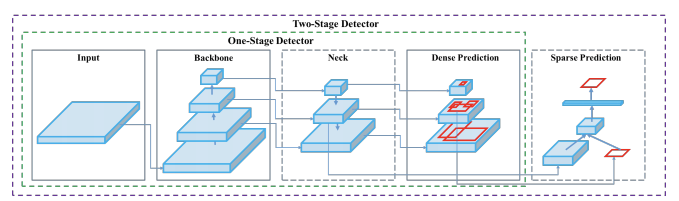


YOLOv5 is a state-of-the-art object detection algorithm that uses deep learning to detect and locate objects in images and videos. It is an upgrade to the popular YOLOv4 algorithm and is known for its speed, accuracy, and versatility. YOLOv5 uses a single-stage object detection pipeline, which means it performs object detection and classification in one step, making it fasterand more efficient than other algorithms that use a multi-stage pipeline.


YOLOv5 is trained using a large dataset of annotated images and is capable of detecting a wide variety of objects, including people, vehicles, animals, and more. It has been used in a variety of applications, including autonomous driving, surveillance, and robotics


The YOLOv5 architecture is a deep neural network that consists of a backbone network, neck network, and head network. The backbone network is responsible for extracting features from the input image, while the neck network is used to combine and refine these features. The head (Prediction section) network is responsible for predicting object bounding boxes, class probabilities, and other object attributes.

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
#View the various classes avilable
%cat {dataset.location}/data.yaml

names:
- airplane
- apple
- backpack
- banana
- baseball bat
- baseball glove
- bear
- bed
- bench
- bicycle
- bird
- boat
- book
- bottle
- bowl
- broccoli
- bus
- cake
- car
- carrot
- cat
- cell phone
- chair
- clock
- couch
- cow
- cup
- dining table
- dog
- donut
- elephant
- fire hydrant
- fork
- frisbee
- giraffe
- hair drier
- handbag
- horse
- hot dog
- keyboard
- kite
- knife
- laptop
- microwave
- motorcycle
- mouse
- orange
- oven
- parking meter
- person
- pizza
- potted plant
- refrigerator
- remote
- sandwich
- scissors
- sheep
- sink
- skateboard
- skis
- snowboard
- spoon
- sports ball
- stop sign
- suitcase
- surfboard
- teddy bear
- tennis racket
- tie
- toaster
- toilet
- toothbrush
- traffic light
- train
- truck
- tv
- umbrella
- vase
- wine glass
- zebra
nc: 80
roboflow:
  license: CC BY 4.0
  project: object-ae0nd
  url: https://universe.roboflow.com/charlie-tp2vf/object-ae0nd/dataset/3
  version: 3
  workspace: charlie-tp2vf
test: ../test/images
train: object-3

In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

Below is the Model configuration Template that can be edited to change model configuration

In [ ]:
%%writetemplate /content/yolov5/models/yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

###4. Training the Yolov5

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --cfg /content/yolov5/models/yolov5s.yaml --weights yolov5s.pt --name yolov5s_results  --cache

/content/yolov5
train: weights=yolov5s.pt, cfg=/content/yolov5/models/yolov5s.yaml, data=/content/yolov5/object-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, o

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

This code saves my custom yolo trained model to a specified folder

In [ ]:
#Move yolov5 to destination folder
import shutil

source_directory = "/content/yolov5"
destination_directory = "/content/drive/MyDrive/PORTFOLIO/Dataset"

# Move the directory
shutil.move(source_directory, destination_directory)

'/content/drive/MyDrive/PORTFOLIO/Dataset/yolov5'

###5.	Results and Analysis

Here we test the model on the validation set

In [ ]:
# trained weights are saved by default in our weights folder
# Validate YOLOv5s on  test dataset
%cd /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/
!python val.py --weights /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/runs/train/yolov5s_results/weights/best.pt --data /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/object-3/data.yaml --task val

/content/drive/MyDrive/PORTFOLIO/Dataset/yolov5
val: data=/content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/object-3/data.yaml, weights=['/content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/runs/train/yolov5s_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 182 layers, 7459581 parameters, 0 gradients
val: Scanning /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/object-3/valid/labels... 924 images, 6 backgrounds, 0 corrupt: 100% 924/924 [00:04<00:00, 189.72it/s]
val: New cache created: /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/object-3/valid/labels.cache
                 Class     Images  Instances          

In [ ]:
# use the best weights!
#change source to directory of testset
%cd /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/
!python detect.py --weights /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/runs/train/yolov5s_results/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/object-3/test/images

/content/drive/MyDrive/PORTFOLIO/Dataset/yolov5
detect: weights=['/content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=/content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/object-3/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 182 layers, 7459581 parameters, 0 gradients
image 1/461 /content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/object-3/test/images/000000000802_jpg.rf.a296424518a1da20ee200019b0ebead7.jpg: 640x640 (no detections), 13.2ms
image 2/461 /content/drive/MyDr

###6.	Conclusion

 Visualizing Object detection on Test Images

In [ ]:
#display inference on ALL test images
#change glob directory to test directory for detection on test images you have

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/PORTFOLIO/Dataset/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")